<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-Description" data-toc-modified-id="Data-Description-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data Description</a></span></li><li><span><a href="#Prophet-Description" data-toc-modified-id="Prophet-Description-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Prophet Description</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Useful-Scripts" data-toc-modified-id="Useful-Scripts-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Useful Scripts</a></span></li><li><span><a href="#Load-the-data" data-toc-modified-id="Load-the-data-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Load the data</a></span></li><li><span><a href="#Data-Preprocessing" data-toc-modified-id="Data-Preprocessing-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Data Preprocessing</a></span><ul class="toc-item"><li><span><a href="#Data-Sample" data-toc-modified-id="Data-Sample-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Data Sample</a></span></li></ul></li><li><span><a href="#Modelling:-prophet" data-toc-modified-id="Modelling:-prophet-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Modelling: prophet</a></span><ul class="toc-item"><li><span><a href="#Create-dataframe-with-two-columns:-ds-and-y" data-toc-modified-id="Create-dataframe-with-two-columns:-ds-and-y-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Create dataframe with two columns: ds and y</a></span></li><li><span><a href="#model1:-default-parameters" data-toc-modified-id="model1:-default-parameters-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>model1: default parameters</a></span></li><li><span><a href="#Model2:-saturation-cap-and-floor" data-toc-modified-id="Model2:-saturation-cap-and-floor-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Model2: saturation cap and floor</a></span></li><li><span><a href="#Model3:-Seasonality" data-toc-modified-id="Model3:-Seasonality-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>Model3: Seasonality</a></span></li><li><span><a href="#Model4:--Changepoints" data-toc-modified-id="Model4:--Changepoints-7.5"><span class="toc-item-num">7.5&nbsp;&nbsp;</span>Model4:  Changepoints</a></span></li><li><span><a href="#Model6:-Holidays" data-toc-modified-id="Model6:-Holidays-7.6"><span class="toc-item-num">7.6&nbsp;&nbsp;</span>Model6: Holidays</a></span></li><li><span><a href="#Plotly-Visualizations-for-prophet" data-toc-modified-id="Plotly-Visualizations-for-prophet-7.7"><span class="toc-item-num">7.7&nbsp;&nbsp;</span>Plotly Visualizations for prophet</a></span></li><li><span><a href="#SMAPE-predictions" data-toc-modified-id="SMAPE-predictions-7.8"><span class="toc-item-num">7.8&nbsp;&nbsp;</span>SMAPE predictions</a></span></li><li><span><a href="#Prophet-Cross-validations" data-toc-modified-id="Prophet-Cross-validations-7.9"><span class="toc-item-num">7.9&nbsp;&nbsp;</span>Prophet Cross validations</a></span></li></ul></li></ul></div>

# Data Description

Reference: https://www.kaggle.com/c/web-traffic-time-series-forecasting/data

```
Original data: train_1.csv
-----------------------------
rows = 145,063
columns = 551
first column = Page
date columns = 2015-07-01, 2015-07-02, ..., 2016-12-31 (550 columns)
file size: 284.6 MB


            
              
Data for modelling: 
--------------------------------------------------------------------
Timeseries   : Now You See Me es (Spain, random_state=42)

For ARIMA    : we have only one timeseries (one column)
For sklearn  : For linear regressor, ensember learners we can have many columns
For fbprophet: we have only dataframe with columns ds and y (additional cap and floor)
```

# Prophet Description

References:
- https://www.analyticsvidhya.com/blog/2018/05/generate-accurate-forecasts-facebook-prophet-python-r/
- https://www.kaggle.com/rpbenatti/dh-desafio-4-benatti
- https://www.kaggle.com/conorm97/prediction-using-prophet-with-us-holidays
- https://www.kaggle.com/springrid/prediction-prophet-movingavg-and-apple-vs-facebook
- https://www.kaggle.com/cpmpml/smape-weirdness


We use a decomposable time series model with three main model components: trend, seasonality, and holidays. They are combined in the following equation:

$$
y(t)=g(t)+s(t)+h(t)+\epsilon_{t}
$$

- g(t): piecewise linear or logistic growth curve for modelling non-periodic changes in time series
- s(t): periodic changes (e.g. weekly/yearly seasonality)
- h(t): effects of holidays (user provided) with irregular schedules
- εt: error term accounts for any unusual changes not accommodated by the model


Using time as a regressor, Prophet is trying to fit several linear and non linear functions of time as components. 

Modeling seasonality as an additive component is the same approach taken by exponential smoothing in [Holt-Winters technique](https://www.analyticsvidhya.com/blog/2018/02/time-series-forecasting-methods/) . 

We are, in effect, framing the forecasting problem as a curve-fitting exercise rather than looking explicitly at the time based dependence of each observation within a time series.


Trend parameters:


|Parameter  |Description  |
| :---| ---: |
| growth | linear’ or ‘logistic’ to specify a linear or logistic trend |
| changepoints | List of dates at which to include potential changepoints (automatic if not specified) |
| n_changepoints | If changepoints in not supplied, you may provide the number of changepoints to be automatically included |
| changepoint_prior_scale | Parameter for changing flexibility of automatic changepoint selection |

Seasonality & Holiday Parameters:

| Parameter | Description |
| :---|:---|
| yearly_seasonality | Fit yearly seasonality |
| weekly_seasonality | Fit weekly seasonality |
| daily_seasonality | Fit daily seasonality |
| holidays | Feed dataframe containing holiday name and date |
| seasonality_prior_scale | Parameter for changing strength of seasonality model |
| holiday_prior_scale | Parameter for changing strength of holiday model |


In [1]:
# from fbprophet import Prophet
# help(Prophet)

# Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(context='notebook', style='whitegrid', rc={'figure.figsize': (12,8)})
plt.style.use('ggplot') # better than sns styles.
matplotlib.rcParams['figure.figsize'] = 12,8

import os
import time

# random state
random_state=100
np.random.seed(random_state)

# Jupyter notebook settings for pandas
#pd.set_option('display.float_format', '{:,.2g}'.format) # numbers sep by comma
from pandas.api.types import CategoricalDtype
np.set_printoptions(precision=3)
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100) # None for all the rows
pd.set_option('display.max_colwidth', 200)

import IPython
from IPython.display import display, HTML, Image, Markdown

print([(x.__name__,x.__version__) for x in [np, pd,sns,matplotlib]])

[('numpy', '1.16.4'), ('pandas', '0.25.2'), ('seaborn', '0.9.0'), ('matplotlib', '3.1.1')]


In [2]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [3]:
from sklearn.preprocessing import StandardScaler

In [4]:
from fbprophet import Prophet
pd.plotting.register_matplotlib_converters() # prophet needs this

from fbprophet.plot import add_changepoints_to_plot

In [5]:
from datetime import date
import holidays

In [6]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

In [7]:
from fbprophet.diagnostics import cross_validation

In [8]:
import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.tools as tls
from plotly.tools import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=False)

[(x.__name__,x.__version__) for x in [plotly]]

[('plotly', '3.10.0')]

# Useful Scripts

In [9]:
%%writefile ../models/util_prophet.py

import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot') # better than sns styles.
matplotlib.rcParams['figure.figsize'] = 12,8

import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.tools as tls
from plotly.tools import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode

from numba import jit
import math

# https://www.kaggle.com/cpmpml/smape-weirdness
@jit
def smape(y_true, y_pred):
    A = y_true.to_numpy().ravel()
    F = y_pred.to_numpy().ravel()[:len(A)]
    return ( 200.0/len(A) * np.sum(  np.abs(F - A) / 
                                  (np.abs(A) + np.abs(F) + np.finfo(float).eps))
           )


# https://www.kaggle.com/c/web-traffic-time-series-forecasting/discussion/37232
@jit
def smape_fast(y_true, y_pred):
    """Fast implementation of SMAPE.
    
    Parameters
    -------------
    y_true: numpy array with no NaNs and non-negative
    y_pred: numpy array with no NaNs and non-negative
    
    Returns
    -------
    out : float
    """
    out = 0
    for i in range(y_true.shape[0]):
        if (y_true[i] != None and np.isnan(y_true[i]) ==  False):
            a = y_true[i]
            b = y_pred[i]
            c = a+b
            if c == 0:
                continue
            out += math.fabs(a - b) / c
    out *= (200.0 / y_true.shape[0])
    return out

def safe_median(s):
    return np.median([x for x in s if ~np.isnan(x)])

def mean_absolute_percentage_error(y_true, y_pred):
    """Calculate the MAPE.
    
    """
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def plot_actual_forecast_mpl(df, forecast_str_lst, forecast_lst):
    """Plot prophet forcast.
    
    Parameters
    -----------
    df -- dataframe with columns ds,y (cap and floor are optional)
    forecast_str_lst -- list of strings
    forecast_lst -- list of forecasts
    
    Example
    --------
    forecast_str_lst = ['forecast1', 'forecast2', 'forecast3','forecast4']
    forecast_lst = [eval(i) for i in forecast_str_lst]
    plot_actual_forecast_mpl(df, ['forecast1'], [forecast1])
    
    """
    import matplotlib.pyplot as plt
    plt.style.use('ggplot')
    

    plt.figure(figsize=(12,8))
    plt.plot(df.y,'b',label='original')
    

    colors10_hex = ['#b03060','#ff0000', '#ff00ff',
                '#67ceab', '#63c56c', '#225e31',
                 '#29b6f6', '#6495ed','#00008b', 
                '#ffa500']

    for i,f in enumerate(forecast_str_lst):
        forecast = forecast_lst[i]
        plt.plot(forecast.yhat,c=colors10_hex[i],label=f)
        
    plt.legend()

def plot_actual_forecast_sns(df, forecast_str_lst, forecast_lst):
    """Plot prophet forcast.
    
    Parameters
    -----------
    df -- dataframe with columns ds,y (cap and floor are optional)
    forecast_str_lst -- list of strings
    
    Example
    --------
    forecast_str_lst = ['forecast1', 'forecast2', 'forecast3','forecast4']
    forecast_lst = [eval(i) for i in forecast_str_lst]
    plot_actual_forecast_sns(df2, forecast_str_lst, forecast_lst)
    
    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.style.use('ggplot')
    

    plt.figure(figsize=(12,8))
    
    df_plot = df2[['y']]
    df_plot.index = pd.to_datetime(df2['ds'])

    for i,f in enumerate(forecast_str_lst):
        forecast = forecast_lst[i]
        ts = forecast.yhat
        ts.index = pd.to_datetime(forecast.ds)
        df_tmp = pd.DataFrame({f: ts})
        df_plot = pd.concat([df_plot,df_tmp], axis=1)


    sns.lineplot(data=df_plot)

def plot_actual_forecast_plotly(df, forecast_str_lst, forecast_lst):
    """Plot prophet forcast.
    
    Parameters
    -----------
    df -- dataframe with columns ds,y (cap and floor are optional)
    forecast_str_lst -- list of strings
    forecast_lst -- list of forecasts
    
    Example
    --------
    forecast_str_lst = ['forecast1', 'forecast2', 'forecast3','forecast4']
    forecast_lst = [eval(i) for i in forecast_str_lst]
    plot_actual_forecast_plotly(df2, forecast_str_lst,forecast_lst)
    
    """
    from plotly.offline import plot, iplot, init_notebook_mode

    df_plot = df[['y']]
    df_plot.index = pd.to_datetime(df['ds'])

    for i,f in enumerate(forecast_str_lst):
        forecast = forecast_lst[i]
        ts = forecast.yhat
        ts.index = pd.to_datetime(forecast.ds)
        df_tmp = pd.DataFrame({f: ts})
        df_plot = pd.concat([df_plot,df_tmp], axis=1)


    iplot([{'x': df_plot.index,'y': df_plot[col],'name': col}  
           for col in df_plot.columns
          ])

def plot_deltas(m):
    """Plot model params delta as bar plots.
    
    Notes:
    -------
    1. If the barplot is all incresing downward,
       we may need to change these quantities:
       - changepoint_range=0.8 (default is 0.8)
       - changepoint_prior_scale=0.7 (default is 0.05)
    
    """
    import matplotlib.pyplot as plt
    plt.style.use('ggplot')


    deltas = m.params['delta'].mean(axis=0)

    fig = plt.figure(figsize=(12, 8))

    ax = fig.add_subplot(111)

    ax.bar(range(len(deltas)), deltas)

    ax.set_ylabel('Rate change (delta)')
    ax.set_xlabel('Potential changepoint')
    fig.tight_layout()

def plot_deltas_plotly(m):
    """Plot prophet forecast params delta values.
    
    """
    import plotly.graph_objs as go
    from plotly.offline import plot, iplot
    
    # data to plot
    x = list(range(len(m.params['delta'][0])))
    y = m.params['delta'].ravel().tolist()
    
    # trace
    trace = go.Bar(x= x,y=y,name='Change Points')
    data = [trace]
    fig = go.Figure(data=data)
    iplot(fig)
    
def outliers_to_na(ts, devs):
    """Replace the outliers by na.
    
    Then we can again fill na by 0.
    Here, in this wikipedia data nans are given 0.
    
    
    """
    median= ts['y'].median()
    std = np.std(ts['y'])

    for x in range(len(ts)):
        val = ts['y'][x]

        if (val < median - devs * std or val > median + devs * std):
            ts['y'][x] = None 
    return ts

def convert_ts_to_prophet_df(ts):
    """Convert timeseries to dataframe required by prophet.
    
    Parameters
    -----------
    ts: timeseries with index as datetime and have values
    
    """
    df = pd.DataFrame(columns=['ds','y'])
    
    df['ds'] = pd.to_datetime(ts.index)
    df.index = df['ds']
    df['y'] = ts.to_numpy()

    return df

def remove_negs_from_forecast(forecast):
    """Replace negative forecasts by 0.
    
    Parameters
    ----------
    forecast -- dataframes returned by prophet
    
    Example
    --------

    m1 = Prophet()
    m1.fit(df1);
    
    future1 = m1.make_future_dataframe(periods=60)
    forecast1 = m1.predict(future1)
    """
    forecast = forecast.copy()
    forecast['yhat'] = forecast['yhat'].clip_lower(0)
    forecast['yhat_lower'] = forecast['yhat_lower'].clip_lower(0)
    forecast['yhat_upper'] = forecast['yhat_upper'].clip_lower(0)
    
    return forecast

Overwriting ../models/util_prophet.py


In [10]:
import sys
sys.path.append('../models')

from util_prophet import smape, smape_fast
from util_prophet import plot_actual_forecast_plotly, plot_deltas_plotly

# Load the data

In [11]:
%%time

df_raw = pd.read_csv('../../data/wiki/train_1.csv',encoding='latin-1')

print(df_raw.shape) # (145063, 551) we have 145k data and 551 columns
df_raw.head()

(145063, 551)
CPU times: user 6.21 s, sys: 709 ms, total: 6.92 s
Wall time: 7.11 s


# Data Preprocessing

## Data Sample

In [12]:
df_sample = df_raw.sample(5, random_state=42) # I like 100 but use 42 here.
df_sample

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,...,2016-11-12,2016-11-13,2016-11-14,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,2016-11-21,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
83529,Phabricator/Project_management_www.mediawiki.org_all-access_spider,6.0,6.0,4.0,6.0,8.0,6.0,4.0,0.0,2.0,3.0,2.0,3.0,3.0,7.0,1.0,4.0,1.0,6.0,2.0,3.0,8.0,4.0,5.0,6.0,3.0,4.0,3.0,5.0,7.0,6.0,5.0,3.0,5.0,2.0,6.0,3.0,8.0,5.0,4.0,2.0,1.0,3.0,4.0,1.0,9.0,2.0,2.0,8.0,5.0,...,4.0,5.0,5.0,10.0,6.0,5.0,5.0,7.0,4.0,6.0,7.0,19.0,10.0,3.0,7.0,13.0,11.0,10.0,7.0,10.0,18.0,6.0,6.0,5.0,8.0,7.0,4.0,10.0,14.0,6.0,4.0,6.0,3.0,7.0,12.0,5.0,9.0,7.0,9.0,23.0,6.0,6.0,11.0,4.0,6.0,5.0,7.0,6.0,6.0,9.0
70433,Now_You_See_Me_es.wikipedia.org_desktop_all-agents,242.0,271.0,309.0,227.0,321.0,311.0,242.0,236.0,243.0,266.0,381.0,347.0,336.0,344.0,267.0,286.0,277.0,325.0,238.0,303.0,268.0,371.0,285.0,266.0,298.0,312.0,303.0,246.0,355.0,272.0,289.0,314.0,400.0,355.0,312.0,277.0,375.0,287.0,349.0,469.0,306.0,309.0,306.0,265.0,263.0,223.0,253.0,338.0,310.0,...,364.0,533.0,444.0,390.0,306.0,343.0,302.0,381.0,439.0,434.0,428.0,714.0,393.0,336.0,386.0,474.0,421.0,316.0,341.0,278.0,346.0,321.0,323.0,305.0,296.0,250.0,244.0,324.0,286.0,357.0,387.0,337.0,268.0,293.0,253.0,263.0,334.0,305.0,305.0,257.0,231.0,222.0,193.0,229.0,334.0,316.0,324.0,268.0,201.0,190.0
84729,ZÃ¼rich_Hackathon_2014_www.mediawiki.org_all-access_spider,3.0,19.0,19.0,30.0,21.0,24.0,17.0,178.0,40.0,1.0,3.0,2.0,4.0,11.0,7.0,13.0,14.0,24.0,7.0,11.0,8.0,3.0,8.0,9.0,4.0,1.0,5.0,4.0,2.0,7.0,3.0,2.0,2.0,9.0,2.0,2.0,5.0,3.0,6.0,3.0,7.0,6.0,11.0,20.0,18.0,7.0,1.0,2.0,4.0,...,5.0,2.0,5.0,3.0,2.0,4.0,4.0,3.0,5.0,5.0,4.0,6.0,8.0,7.0,11.0,8.0,5.0,5.0,5.0,5.0,9.0,7.0,5.0,3.0,8.0,10.0,3.0,7.0,5.0,1.0,7.0,8.0,6.0,7.0,5.0,2.0,10.0,6.0,5.0,10.0,6.0,7.0,4.0,8.0,2.0,4.0,9.0,4.0,11.0,12.0
7969,ÃrythrÃ©e_fr.wikipedia.org_desktop_all-agents,672.0,513.0,774.0,1164.0,546.0,755.0,555.0,494.0,4801.0,4514.0,1101.0,1113.0,747.0,923.0,601.0,554.0,381.0,322.0,323.0,657.0,417.0,612.0,991.0,728.0,556.0,777.0,663.0,602.0,676.0,855.0,462.0,315.0,1440.0,812.0,1178.0,1307.0,904.0,740.0,472.0,367.0,431.0,1053.0,790.0,1122.0,1312.0,598.0,599.0,756.0,890.0,...,415.0,348.0,460.0,542.0,435.0,439.0,360.0,602.0,367.0,488.0,466.0,463.0,500.0,391.0,347.0,347.0,460.0,433.0,396.0,383.0,376.0,306.0,327.0,386.0,356.0,335.0,301.0,366.0,256.0,361.0,388.0,14152.0,418.0,390.0,353.0,313.0,367.0,310.0,374.0,282.0,308.0,294.0,358.0,204.0,323.0,438.0,345.0,299.0,306.0,211.0
92077,Metallica_es.wikipedia.org_all-access_all-agents,1534.0,1644.0,1704.0,1569.0,1534.0,1577.0,1608.0,1731.0,1919.0,1628.0,1640.0,1646.0,1635.0,1690.0,2132.0,1635.0,1680.0,1638.0,1658.0,1651.0,1687.0,1607.0,1758.0,1778.0,1625.0,1725.0,1951.0,1802.0,1746.0,1771.0,1813.0,2014.0,2161.0,2075.0,2146.0,1808.0,1774.0,1875.0,1931.0,1867.0,1672.0,1836.0,2004.0,1907.0,1930.0,1659.0,1843.0,1741.0,1837.0,...,3394.0,3452.0,3406.0,3479.0,3711.0,8146.0,10561.0,8201.0,6535.0,5544.0,4764.0,5125.0,4927.0,4128.0,3830.0,3884.0,3467.0,3466.0,3165.0,3047.0,2929.0,2946.0,3123.0,3011.0,2856.0,2905.0,2792.0,2908.0,2596.0,265

In [13]:
ts = df_sample.iloc[1,1:].astype(np.float64)
ts.name = df_sample.iloc[1,0]

ts.index = pd.to_datetime(ts.index,format='%Y-%m-%d')
ts.head()

2015-07-01    242.0
2015-07-02    271.0
2015-07-03    309.0
2015-07-04    227.0
2015-07-05    321.0
Name: Now_You_See_Me_es.wikipedia.org_desktop_all-agents, dtype: float64

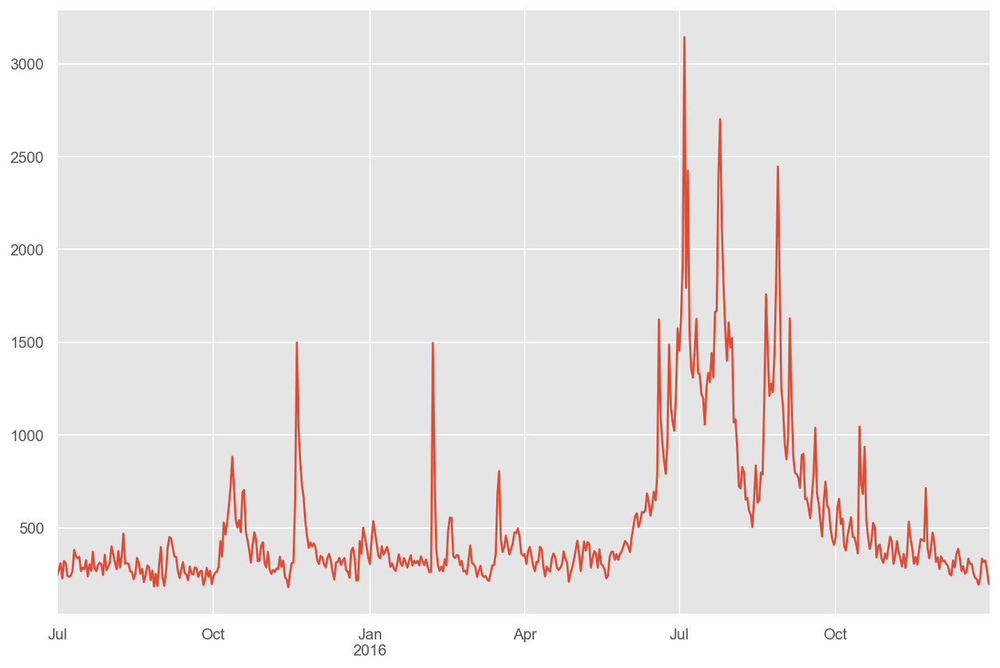

In [14]:
pd.plotting.register_matplotlib_converters() # prophet needs this
ts.plot()

In [15]:
iplot([{'x': ts.index,'y': ts.to_numpy()} ])

# Modelling: prophet

## Create dataframe with two columns: ds and y

In [16]:
# prophet expects two columns: ds and y
df1 = pd.DataFrame({'ds': ts.index, 'y': ts.to_numpy()})

print(df1.dtypes)
df1.head()

ds    datetime64[ns]
y            float64
dtype: object


,ds,y
0,2015-07-01,242.0
1,2015-07-02,271.0
2,2015-07-03,309.0
3,2015-07-04,227.0
4,2015-07-05,321.0


In [17]:
# df1.plot(kind='line',x='ds',y='y')

In [18]:
iplot([{'x': df1['ds'], 'y': df1['y']}])

## model1: default parameters

In [19]:
m1 = Prophet()
m1.fit(df1);

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [23]:
# future
future1 = m1.make_future_dataframe(periods=60)

print(df1.shape)
print(future1.shape)

future1.head().append(future1.tail())

(550, 2)
(610, 1)


,ds
0,2015-07-01
1,2015-07-02
2,2015-07-03
3,2015-07-04
4,2015-07-05
605,2017-02-25
606,2017-02-26
607,2017-02-27
608,2017-02-28
609,2017-03-01


In [21]:
# forecast
forecast1 = m1.predict(future1)

print(forecast1.shape)

forecast1.head(2)

(610, 16)


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-07-01,307.669162,-60.857334,604.587124,307.669162,307.669162,-21.387939,-21.387939,-21.387939,-21.387939,-21.387939,-21.387939,0.0,0.0,0.0,286.281223
1,2015-07-02,307.934020,-76.016063,622.838474,307.934020,307.934020,-40.764080,-40.764080,-40.764080,-40.764080,-40.764080,-40.764080,0.0,0.0,0.0,267.169940


In [23]:
forecast1.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'weekly', 'weekly_lower', 'weekly_upper', 'multiplicative_terms',
       'multiplicative_terms_lower', 'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [24]:
forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
605,2017-02-25,-283.603081,-629.413495,75.988647
606,2017-02-26,-189.211829,-528.859497,157.353156
607,2017-02-27,-195.286815,-541.619777,144.026502
608,2017-02-28,-306.311257,-651.215643,51.341716
609,2017-03-01,-313.308456,-644.543960,36.984635


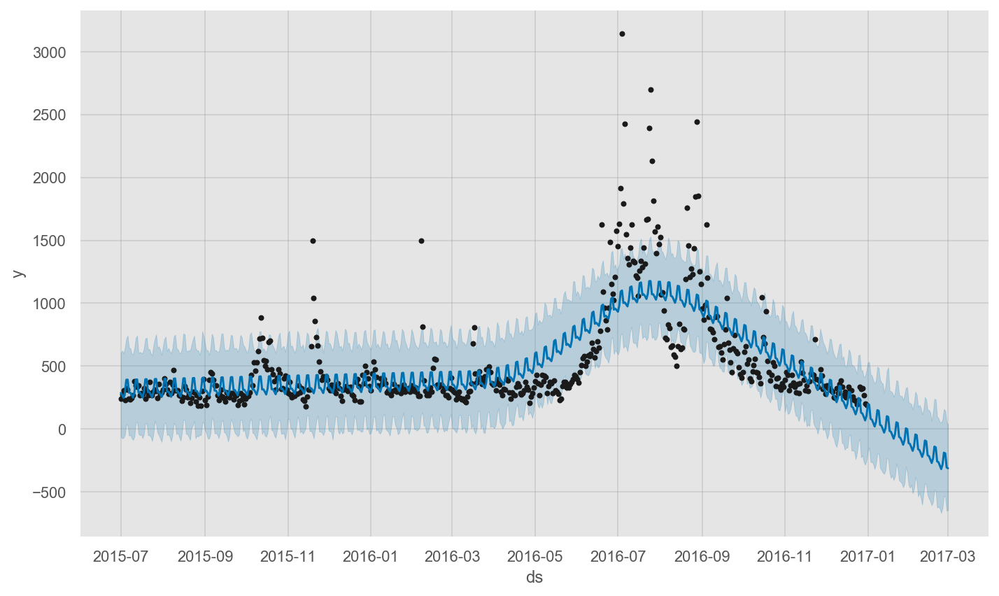

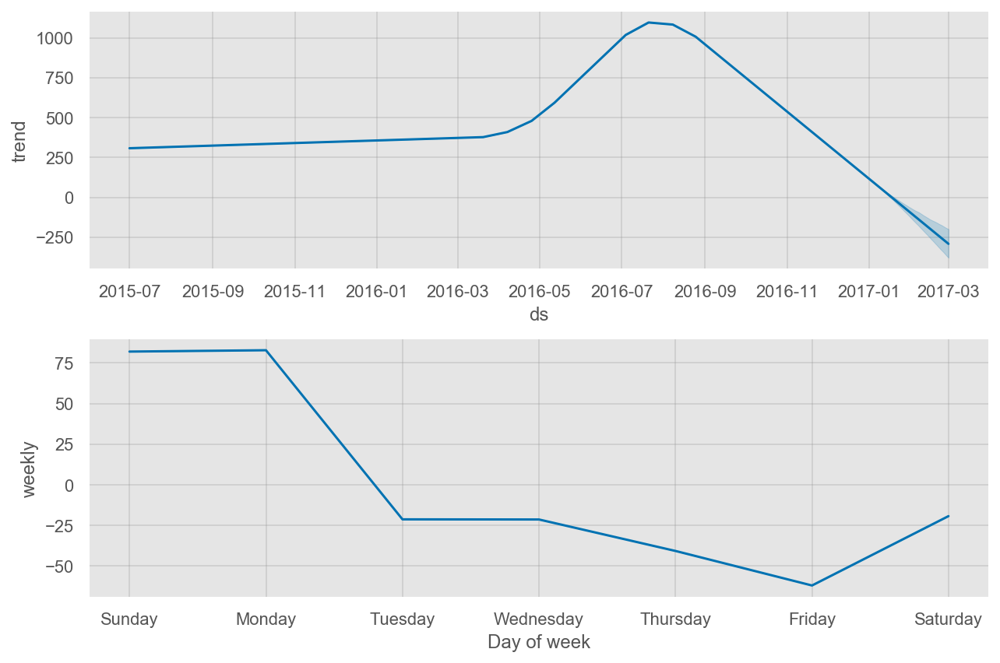

In [25]:
fig1 = m1.plot(forecast1)
fig2 = m1.plot_components(forecast1)

In [26]:
plot_actual_forecast_plotly(df1, ['forecast1'],[forecast1])

In [27]:
forecast1.tail()['yhat']

605   -283.603081
606   -189.211829
607   -195.286815
608   -306.311257
609   -313.308456
Name: yhat, dtype: float64

In [28]:
# observation: this prediction only captures the trend
# problem    : the trend is going down and predicts negative values
#
# todo:
# use logistic growth and give cap and floor for dataframes df and forecast.

## Model2: saturation cap and floor

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



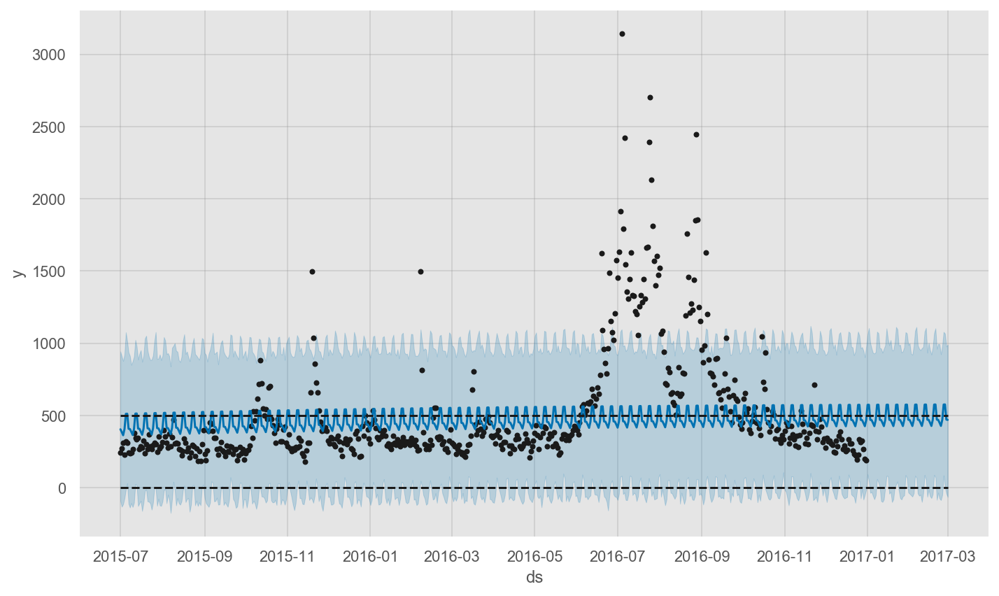

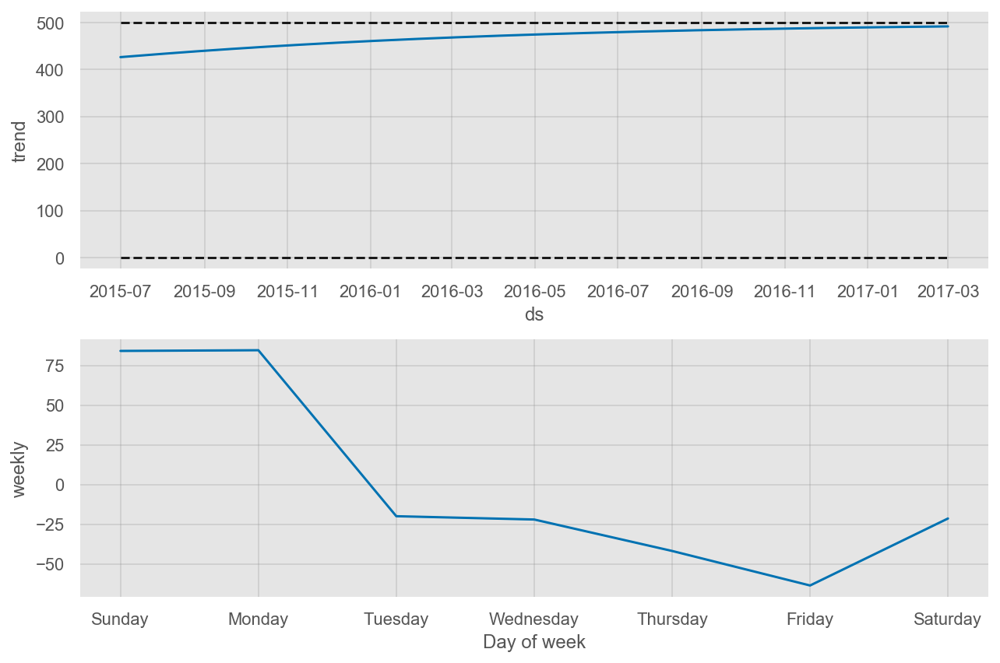

In [29]:
# set the cap to values of trend
df2 = df1.copy()
df2['cap'] = 500
df2['floor'] = 0.0

future2 = future1.copy()
future2['cap'] = 500
future2['floor'] = 0.0

# take growth = 'logistic'
m2 = Prophet(growth='logistic')
forecast2 = m2.fit(df2).predict(future2)

# Plotting both the forecast predictions and components
fig1 = m2.plot(forecast2)
fig2 = m2.plot_components(forecast2)

In [30]:
# Conclusion: in this case the prediction trend has max 500 and min 0.0
#             as we have set the values.

## Model3: Seasonality

/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



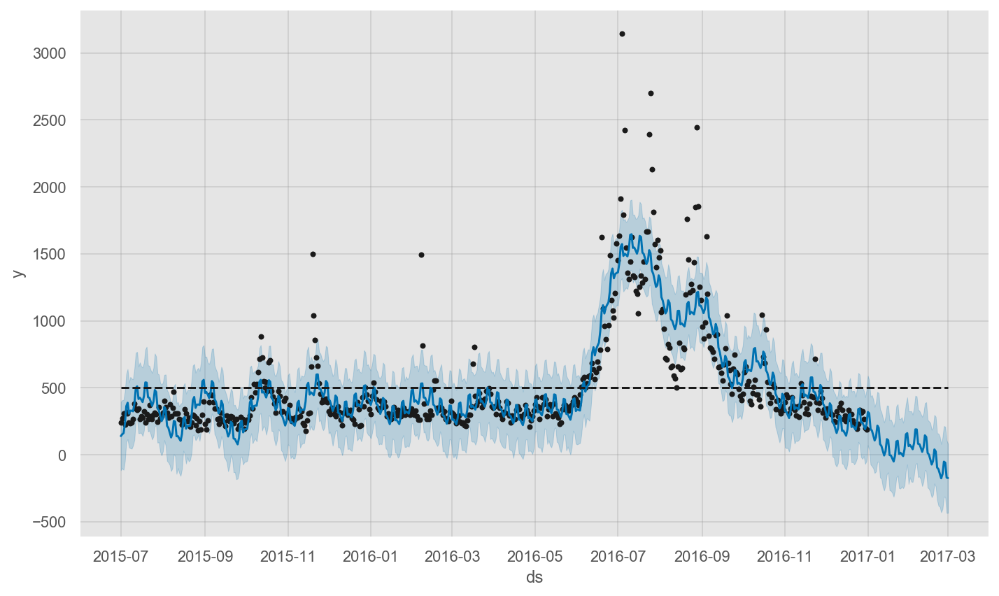

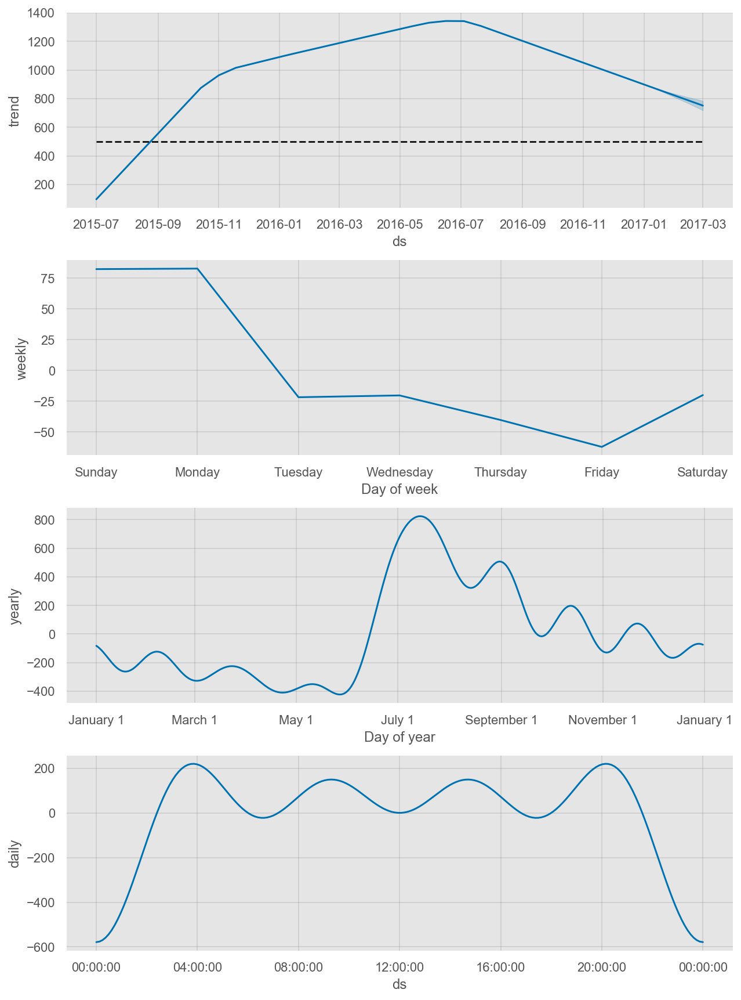

In [31]:
# keep default growth='linear' instead of logistic

m3 = Prophet(growth='linear',
            daily_seasonality=True,
            weekly_seasonality=True,
            yearly_seasonality=True)

forecast3 = m3.fit(df2).predict(future2)

fig1 = m3.plot(forecast3)
fig2 = m3.plot_components(forecast3)

In [32]:
plot_actual_forecast_plotly(df2, ['forecast3'],[forecast3])

In [33]:
forecast3.tail()['yhat']

605   -144.561322
606    -51.712132
607    -59.376412
608   -170.516699
609   -174.133555
Name: yhat, dtype: float64

In [34]:
# observations:
# 1. trend goes downwards in the end and gives negative values
# 2. gives better fit than last time
# 3. peaks are captured better.

## Model4:  Changepoints

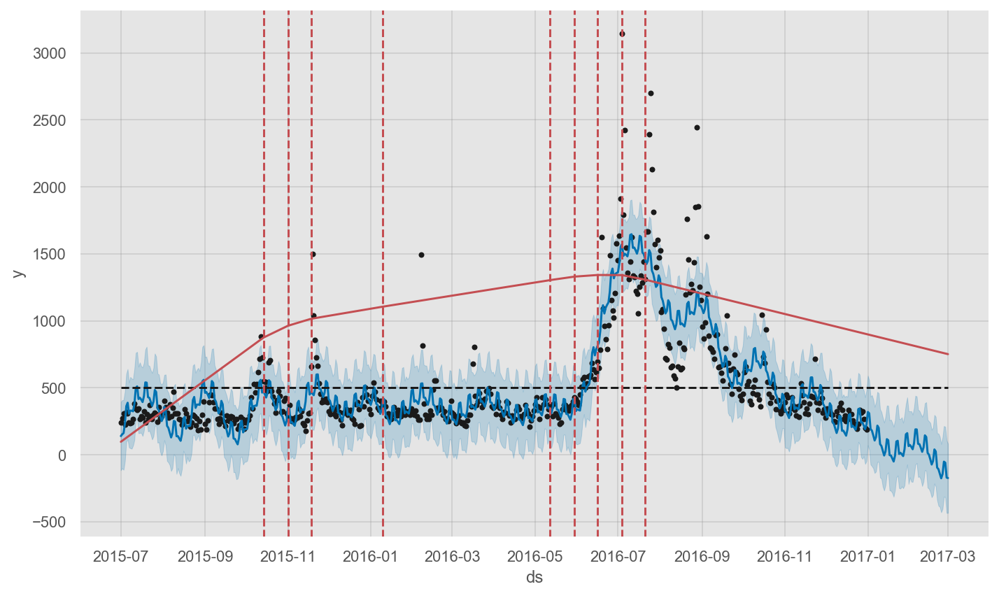

In [35]:
from fbprophet.plot import add_changepoints_to_plot

fig = m3.plot(forecast3)

a = add_changepoints_to_plot(fig.gca(), m3, forecast3)

In [36]:
# observation:
# 1. default changepoints = 0.8 takes only 80% of data to find changepoints
# 2. we see some peaks after 80% of data, increase changepoints

/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



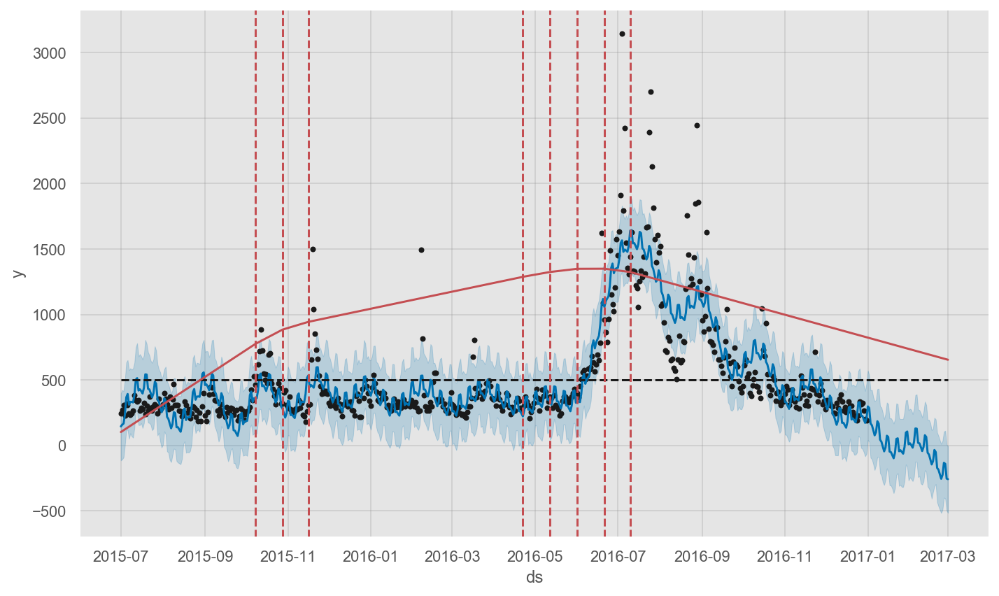

In [37]:
m4 = Prophet(daily_seasonality=True,
            weekly_seasonality=True,
            yearly_seasonality=True,
            changepoint_range=0.9)

forecast4 = m4.fit(df2).predict(future2)

fig = m4.plot(forecast4)

a = add_changepoints_to_plot(fig.gca(), m4, forecast4)

In [38]:
plot_deltas_plotly(m4)

In [39]:
# observation:
# 1. when changepoint range increase, predictions becomes more negative
#    upto about 17, then becomes more positive but still negative.
# 2. I can fiddle with default changepoint 0.8.
#
# todo:
# default changepoint prior scale = 0.05, increase it to make more flexible trend.

/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



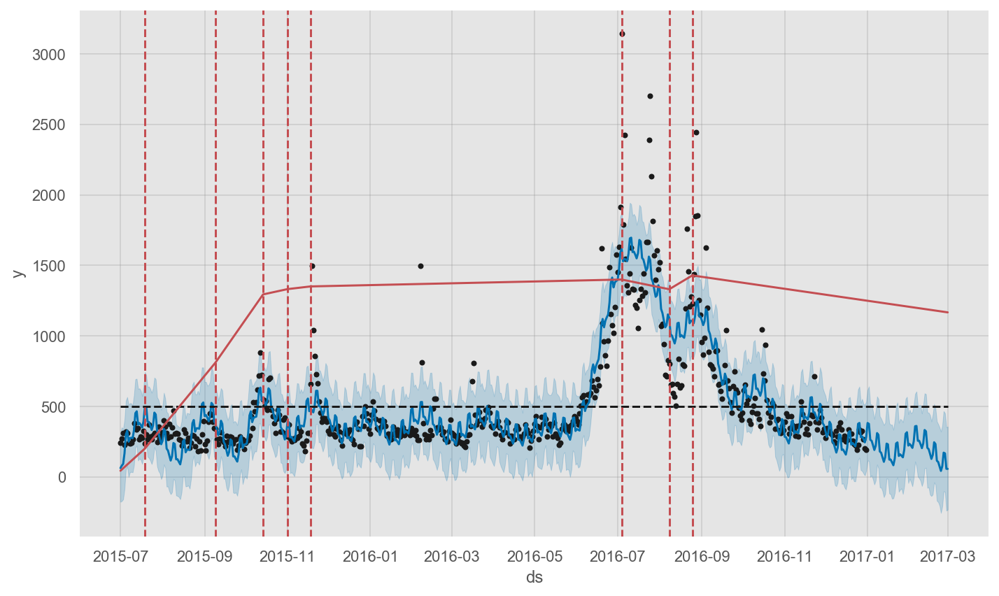

In [40]:
m5 = Prophet(daily_seasonality=True,
            weekly_seasonality=True,
            yearly_seasonality=True,
            changepoint_range=0.8,
            changepoint_prior_scale=0.7)

forecast5 = m5.fit(df2).predict(future2)

fig = m5.plot(forecast5)

a = add_changepoints_to_plot(fig.gca(), m5, forecast5)

In [41]:
plot_deltas_plotly(m5)

In [42]:
forecast_str_lst = ['forecast1', 'forecast2', 'forecast3','forecast4','forecast5']
forecast_lst = [eval(i) for i in forecast_str_lst]
plot_actual_forecast_plotly(df2, forecast_str_lst,forecast_lst)


In [43]:
# observations:
# 1. forecast5 is almost similar to 4 and 3
# 2. forecast5 gives better peaks than 3

## Model6: Holidays

In [44]:
df_sample

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,2015-07-11,2015-07-12,2015-07-13,2015-07-14,2015-07-15,2015-07-16,2015-07-17,2015-07-18,2015-07-19,2015-07-20,2015-07-21,2015-07-22,2015-07-23,2015-07-24,2015-07-25,2015-07-26,2015-07-27,2015-07-28,2015-07-29,2015-07-30,2015-07-31,2015-08-01,2015-08-02,2015-08-03,2015-08-04,2015-08-05,2015-08-06,2015-08-07,2015-08-08,2015-08-09,2015-08-10,2015-08-11,2015-08-12,2015-08-13,2015-08-14,2015-08-15,2015-08-16,2015-08-17,2015-08-18,...,2016-11-12,2016-11-13,2016-11-14,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,2016-11-21,2016-11-22,2016-11-23,2016-11-24,2016-11-25,2016-11-26,2016-11-27,2016-11-28,2016-11-29,2016-11-30,2016-12-01,2016-12-02,2016-12-03,2016-12-04,2016-12-05,2016-12-06,2016-12-07,2016-12-08,2016-12-09,2016-12-10,2016-12-11,2016-12-12,2016-12-13,2016-12-14,2016-12-15,2016-12-16,2016-12-17,2016-12-18,2016-12-19,2016-12-20,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
83529,Phabricator/Project_management_www.mediawiki.org_all-access_spider,6.0,6.0,4.0,6.0,8.0,6.0,4.0,0.0,2.0,3.0,2.0,3.0,3.0,7.0,1.0,4.0,1.0,6.0,2.0,3.0,8.0,4.0,5.0,6.0,3.0,4.0,3.0,5.0,7.0,6.0,5.0,3.0,5.0,2.0,6.0,3.0,8.0,5.0,4.0,2.0,1.0,3.0,4.0,1.0,9.0,2.0,2.0,8.0,5.0,...,4.0,5.0,5.0,10.0,6.0,5.0,5.0,7.0,4.0,6.0,7.0,19.0,10.0,3.0,7.0,13.0,11.0,10.0,7.0,10.0,18.0,6.0,6.0,5.0,8.0,7.0,4.0,10.0,14.0,6.0,4.0,6.0,3.0,7.0,12.0,5.0,9.0,7.0,9.0,23.0,6.0,6.0,11.0,4.0,6.0,5.0,7.0,6.0,6.0,9.0
70433,Now_You_See_Me_es.wikipedia.org_desktop_all-agents,242.0,271.0,309.0,227.0,321.0,311.0,242.0,236.0,243.0,266.0,381.0,347.0,336.0,344.0,267.0,286.0,277.0,325.0,238.0,303.0,268.0,371.0,285.0,266.0,298.0,312.0,303.0,246.0,355.0,272.0,289.0,314.0,400.0,355.0,312.0,277.0,375.0,287.0,349.0,469.0,306.0,309.0,306.0,265.0,263.0,223.0,253.0,338.0,310.0,...,364.0,533.0,444.0,390.0,306.0,343.0,302.0,381.0,439.0,434.0,428.0,714.0,393.0,336.0,386.0,474.0,421.0,316.0,341.0,278.0,346.0,321.0,323.0,305.0,296.0,250.0,244.0,324.0,286.0,357.0,387.0,337.0,268.0,293.0,253.0,263.0,334.0,305.0,305.0,257.0,231.0,222.0,193.0,229.0,334.0,316.0,324.0,268.0,201.0,190.0
84729,ZÃ¼rich_Hackathon_2014_www.mediawiki.org_all-access_spider,3.0,19.0,19.0,30.0,21.0,24.0,17.0,178.0,40.0,1.0,3.0,2.0,4.0,11.0,7.0,13.0,14.0,24.0,7.0,11.0,8.0,3.0,8.0,9.0,4.0,1.0,5.0,4.0,2.0,7.0,3.0,2.0,2.0,9.0,2.0,2.0,5.0,3.0,6.0,3.0,7.0,6.0,11.0,20.0,18.0,7.0,1.0,2.0,4.0,...,5.0,2.0,5.0,3.0,2.0,4.0,4.0,3.0,5.0,5.0,4.0,6.0,8.0,7.0,11.0,8.0,5.0,5.0,5.0,5.0,9.0,7.0,5.0,3.0,8.0,10.0,3.0,7.0,5.0,1.0,7.0,8.0,6.0,7.0,5.0,2.0,10.0,6.0,5.0,10.0,6.0,7.0,4.0,8.0,2.0,4.0,9.0,4.0,11.0,12.0
7969,ÃrythrÃ©e_fr.wikipedia.org_desktop_all-agents,672.0,513.0,774.0,1164.0,546.0,755.0,555.0,494.0,4801.0,4514.0,1101.0,1113.0,747.0,923.0,601.0,554.0,381.0,322.0,323.0,657.0,417.0,612.0,991.0,728.0,556.0,777.0,663.0,602.0,676.0,855.0,462.0,315.0,1440.0,812.0,1178.0,1307.0,904.0,740.0,472.0,367.0,431.0,1053.0,790.0,1122.0,1312.0,598.0,599.0,756.0,890.0,...,415.0,348.0,460.0,542.0,435.0,439.0,360.0,602.0,367.0,488.0,466.0,463.0,500.0,391.0,347.0,347.0,460.0,433.0,396.0,383.0,376.0,306.0,327.0,386.0,356.0,335.0,301.0,366.0,256.0,361.0,388.0,14152.0,418.0,390.0,353.0,313.0,367.0,310.0,374.0,282.0,308.0,294.0,358.0,204.0,323.0,438.0,345.0,299.0,306.0,211.0
92077,Metallica_es.wikipedia.org_all-access_all-agents,1534.0,1644.0,1704.0,1569.0,1534.0,1577.0,1608.0,1731.0,1919.0,1628.0,1640.0,1646.0,1635.0,1690.0,2132.0,1635.0,1680.0,1638.0,1658.0,1651.0,1687.0,1607.0,1758.0,1778.0,1625.0,1725.0,1951.0,1802.0,1746.0,1771.0,1813.0,2014.0,2161.0,2075.0,2146.0,1808.0,1774.0,1875.0,1931.0,1867.0,1672.0,1836.0,2004.0,1907.0,1930.0,1659.0,1843.0,1741.0,1837.0,...,3394.0,3452.0,3406.0,3479.0,3711.0,8146.0,10561.0,8201.0,6535.0,5544.0,4764.0,5125.0,4927.0,4128.0,3830.0,3884.0,3467.0,3466.0,3165.0,3047.0,2929.0,2946.0,3123.0,3011.0,2856.0,2905.0,2792.0,2908.0,2596.0,265

In [45]:
# observation:
# 1. I have chosen the wikipedia page of Now you see me in Spain as our
#    time series dataframe. I will look at holidays in Spain.

In [46]:
from datetime import date
import holidays

In [47]:
# Select country
es_holidays = holidays.Spain(years = [2015,2016,2017])
es_holidays = pd.DataFrame.from_dict(es_holidays, orient='index')
es_holidays = pd.DataFrame({'holiday': 'Spain', 'ds': es_holidays.index})

print(es_holidays.shape)
es_holidays.head()

(30, 2)


,holiday,ds
0,Spain,2016-01-01
1,Spain,2016-01-06
2,Spain,2016-03-25
3,Spain,2016-05-01
4,Spain,2016-08-15


/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



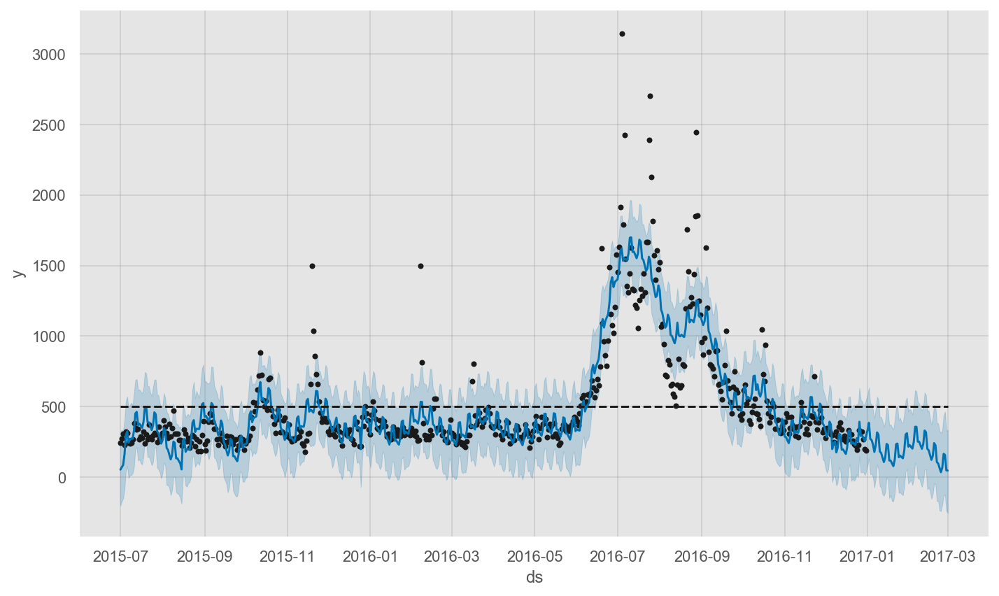

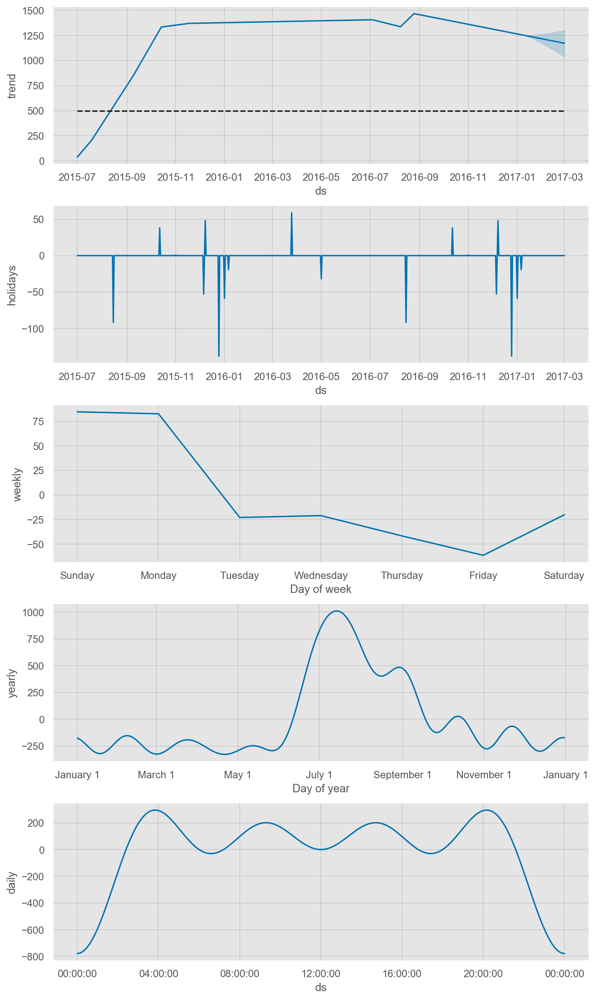

In [48]:
m6 = Prophet(growth='linear',
            daily_seasonality=True,
            weekly_seasonality=True,
            yearly_seasonality=True,
            changepoint_range=0.8,
            changepoint_prior_scale=0.7,
            holidays=es_holidays)

# add holidays
m6.add_country_holidays(country_name='ES')

# forecast
forecast6 = m6.fit(df2).predict(future2)

# plot forecasts
fig1 = m6.plot(forecast6)
fig2 = m6.plot_components(forecast6)

## Plotly Visualizations for prophet

In [49]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m6, forecast6)
py.iplot(fig)

## SMAPE predictions

The formula for SMAPE (Symmetric Mean Absolute Percentage Error) is given below:  

$$
S M A P E=\frac{100 \%}{n} \sum_{t=1}^{n} \frac{\left|F_{t}-A_{t}\right|}{\left(\left|A_{t}\right|+\left|F_{t}\right|\right) / 2}
$$

Where, F is forecast and A is the actual value of time series at given time t.

Python implementation:
```python
def smape(A, F):
    F = A[:len(A)]
    return ( 200.0/len(A) * np.sum(  np.abs(F - A) / 
                                  (np.abs(A) + np.abs(F) + np.finfo(float).eps))
           )
```

Despite the name Symmetric, the smape is not actually symmetric. Take this
example from [wikipedia](https://www.wikiwand.com/en/Symmetric_mean_absolute_percentage_error) for an example:

The SMAPE is not symmetric since over- and under-forecasts are not treated equally. 
This is illustrated by the following example by applying the SMAPE formula:

```
Over-forecasting: At = 100 and Ft = 110 give SMAPE = 4.76%
Under-forecasting: At = 100 and Ft = 90 give SMAPE = 5.26%.
```


In [50]:
def smape_np(A, F):
    F = F[:len(A)]
    return ( 200.0/len(A) * np.sum(  np.abs(F - A) / 
                                  (np.abs(A) + np.abs(F) + np.finfo(float).eps))
           )

In [51]:
y_true = df2[['y']]
y_pred = forecast1[['yhat']].iloc[:len(y_true)]


print(y_true.shape, y_pred.shape)

df_ypreds = pd.concat([y_true, y_pred],axis=1,sort=False).dropna()

df_ypreds.head().append(df_ypreds.tail())

(550, 1) (550, 1)


,y,yhat
0,242.0,286.281223
1,271.0,267.169940
2,309.0,246.173344
3,227.0,289.144558
4,321.0,390.709821
545,316.0,128.965424
546,324.0,121.968225
547,268.0,95.682930
548,201.0,67.512323
549,190.0,103.309525


In [52]:
smape_np(df2['y'].to_numpy(), forecast1['yhat'].to_numpy())

28.78204755751966

In [53]:
forecasts = [ 'forecast{}'.format(i) for  i in range(1,7)]

smapes = [ smape(df2.y,eval('forecast{}.yhat'.format(i)))  for i in range(1,7)]
smapes_fast = [ smape_fast(df2.y,eval('forecast{}.yhat'.format(i)))
               for i in range(1,7)]


df_eval = pd.DataFrame({'forecast': forecasts,
                        'smape': smapes,
                        'fast_smape': smapes_fast})

df_eval

,forecast,smape,fast_smape
0,forecast1,28.782048,28.782048
1,forecast2,42.314824,42.314824
2,forecast3,23.161088,23.161088
3,forecast4,23.539834,23.539834
4,forecast5,22.007336,22.007336
5,forecast6,21.683705,21.683705


## Prophet Cross validations

In [54]:
from fbprophet.diagnostics import cross_validation

In [55]:
cv_results = cross_validation(m6,
                              initial='360 days',
                              period='30 days',
                              horizon='60 days')

INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-07-04 00:00:00 and 2016-11-01 00:00:00
/Users/poudel/miniconda3/envs/dataSc/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [56]:
smape_cv = smape(cv_results.y, cv_results.yhat)
smape_cv

80.54604679671692